In [1]:
#imported a bunch of stuff
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn import preprocessing as prep
import os
import statistics
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn import metrics

root_dir = os.getcwd()
df = pd.read_csv(root_dir + "/icu_data.csv")
df

,group,ID,outcome,age,gendera,BMI,hypertensive,atrialfibrillation,CHD with no MI,diabetes,...,Blood sodium,Blood calcium,Chloride,Anion gap,Magnesium ion,PH,Bicarbonate,Lactic acid,PCO2,EF
0,1,125047,0.0,72,1,37.588179,0,0,0,1,...,138.750000,7.463636,109.166667,13.166667,2.618182,7.230,21.166667,0.5,40.0,55
1,1,139812,0.0,75,2,NaN,0,0,0,0,...,138.888889,8.162500,98.444444,11.444444,1.887500,7.225,33.444444,0.5,78.0,55
2,1,109787,0.0,83,2,26.572634,0,0,0,0,...,140.714286,8.266667,105.857143,10.000000,2.157143,7.268,30.571429,0.5,71.5,35
3,1,130587,0.0,43,2,83.264629,0,0,0,0,...,138.500000,9.476923,92.071429,12.357143,1.942857,7.370,38.571429,0.6,75.0,55
4,1,138290,0.0,75,2,31.824842,1,0,0,0,...,136.666667,8.733333,104.500000,15.166667,1.650000,7.250,22.000000,0.6,50.0,55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1172,2,171130,0.0,62,1,25.516870,1,1,0,1,...,136.714286,10.271429,94.428571,20.142857,2.714286,NaN,27.714286,NaN,NaN,40
1173,2,101659,0.0,78,1,25.822710,0,1,0,1,...,135.680000,10.523529,101.720000,18.160000,2.012500,NaN,20.480000,NaN,NaN,30
1174,2,162069,0.0,85,2,23.891779,1,1,0,1,...,136.000000,8.466667,97.285714,14.000000,2.028571,NaN,28.857143,NaN,NaN,55
1175,2,120967,0.0,79,2,35.288554,0,0,1,1,...,140.000000,8.183333,104.000000,15.750000,2.090000,NaN,24.375000,NaN,NaN,25


see where there are null values to deal with missing data

In [2]:
print(df.isnull().sum())

group                         0
ID                            0
outcome                       1
age                           0
gendera                       0
BMI                         215
hypertensive                  0
atrialfibrillation            0
CHD with no MI                0
diabetes                      0
deficiencyanemias             0
depression                    0
Hyperlipemia                  0
Renal failure                 0
COPD                          0
heart rate                   13
Systolic blood pressure      16
Diastolic blood pressure     16
Respiratory rate             13
temperature                  19
SP O2                        13
Urine output                 36
hematocrit                    0
RBC                           0
MCH                           0
MCHC                          0
MCV                           0
RDW                           0
Leucocyte                     0
Platelets                     0
Neutrophils                 144
Basophil

# Missing Values

Replace NaN with median of the not missing values in the columns function

In [3]:
def replace_nan_median(x, col):
    if pd.isna(x):
        return int(df[col].median())
    return x

calling the replace NaN with median function for all of the features that have missing data

In [4]:
#BMI
df['BMI'] = df['BMI'].apply(lambda x: replace_nan_median(x, 'BMI'))

#heartrate
df['heart rate'] = df['heart rate'].apply(lambda x: replace_nan_median(x, 'heart rate'))

#Systolic blood pressure
df['Systolic blood pressure'] = df['Systolic blood pressure'].apply(lambda x: replace_nan_median(x, 'Systolic blood pressure'))

#Diastolic blood pressure
df['Diastolic blood pressure'] = df['Diastolic blood pressure'].apply(lambda x: replace_nan_median(x, 'Diastolic blood pressure'))

#Respiratory rate
df['Respiratory rate'] = df['Respiratory rate'].apply(lambda x: replace_nan_median(x, 'Respiratory rate'))

#temperature
df['temperature'] = df['temperature'].apply(lambda x: replace_nan_median(x, 'temperature'))

#SP O2
df['SP O2'] = df['SP O2'].apply(lambda x: replace_nan_median(x, 'SP O2'))

#Urine output
df['Urine output'] = df['Urine output'].apply(lambda x: replace_nan_median(x, 'Urine output'))

#PT
df['PT'] = df['PT'].apply(lambda x: replace_nan_median(x, 'PT'))

#INR
df['INR'] = df['INR'].apply(lambda x: replace_nan_median(x, 'INR'))

#glucose
df['glucose'] = df['glucose'].apply(lambda x: replace_nan_median(x, 'glucose'))

#Blood calcium - drop NaN row 
df['Blood calcium'] = df['Blood calcium'].apply(lambda x: replace_nan_median(x, 'Blood calcium'))


Dropped all of these columns beacuse they had too much missing data, would have to replace 1/5 of values with median which would mess with results

In [5]:
#Dropped all of these columns beacuse they had to much missing data to 

#Creatine kinase - drop col
#PH - drop col
#Lactic acid - drop col
#PCO2 - drop col
#Neutrophils - drop col
#Basophils - drop col
#Lymphocyte = drop col
#drop ID b/c we won't be using it, serves no purpose besides identification which we have with row numbers

df = df.drop(['Creatine kinase', 'PH', 'Lactic acid', 'PCO2', 'Neutrophils', 'Neutrophils', 'Basophils', 
              'Lymphocyte', 'ID'], axis=1)

In [6]:
print(df.isnull().sum())

group                       0
outcome                     1
age                         0
gendera                     0
BMI                         0
hypertensive                0
atrialfibrillation          0
CHD with no MI              0
diabetes                    0
deficiencyanemias           0
depression                  0
Hyperlipemia                0
Renal failure               0
COPD                        0
heart rate                  0
Systolic blood pressure     0
Diastolic blood pressure    0
Respiratory rate            0
temperature                 0
SP O2                       0
Urine output                0
hematocrit                  0
RBC                         0
MCH                         0
MCHC                        0
MCV                         0
RDW                         0
Leucocyte                   0
Platelets                   0
PT                          0
INR                         0
NT-proBNP                   0
Creatinine                  0
Urea nitro

In [7]:
#outcome - drop the NaN since we should not assume anything because this is what we are basing predictions on
index_to_drop = df.index[df['outcome'].isna()].tolist()[0]
df = df.drop(index_to_drop, axis=0)

In [8]:
#convert outcome to int instead of floating point, values stay the same just without decimal
df['outcome'] = df['outcome'].astype(int)

# Outliers

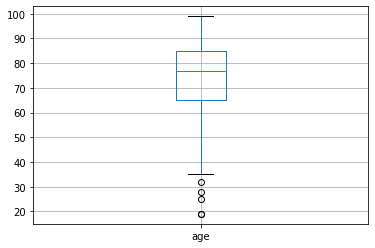

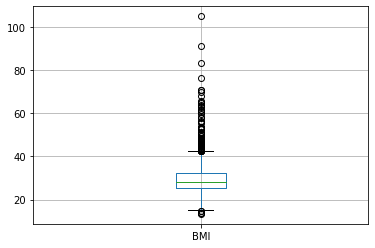

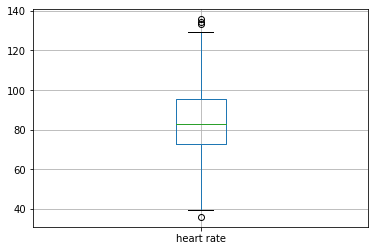

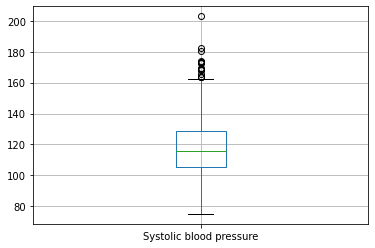

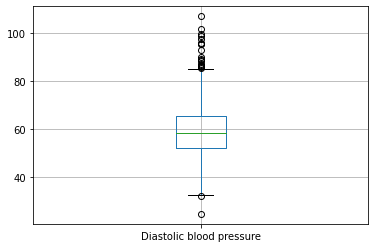

...

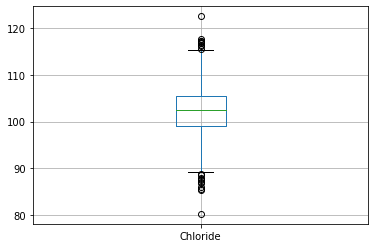

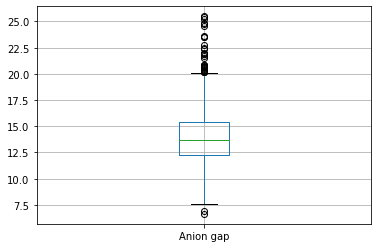

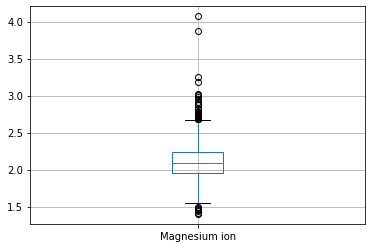

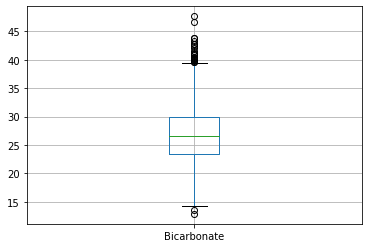

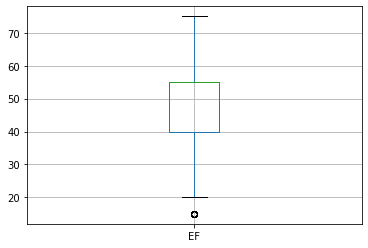

In [9]:
#columns with 0/1 values
    #group, outcome, gendera,hypertensive, atrialfibrillation, CHD with no MI, diabetes, deficiencyanemias
    #depression, hyperlipemia, renal failure, COPD
group_cols = ['group', 'outcome', 'gendera', 'hypertensive', 'atrialfibrillation', 'CHD with no MI', 
              'diabetes', 'deficiencyanemias', 'depression', 'Hyperlipemia', 'Renal failure', 'COPD']
numerical_cols = []

#populate numerical_cols with all cols that are not in group_cols
for column in df: 
    if column not in group_cols:
        numerical_cols.append(column)

#show boxplot for all columns where outliers are possible (all columns listed in numerical_cols)
for elem in numerical_cols:
    df.boxplot([elem])
    plt.show()

Chose not to modify any of the outliers because there are not many outliers that are outside the range of possibilty for all of these features. Getting rid of the outliers may impact our results because we want to see if some of these factors are increasing or decreasing accuracy. Later on when selecting features we can get rid of some of the features with many outliers and see if they are worth dealing using. 

# Feature Selection

In [10]:
numerical_cols

['age',
 'BMI',
 'heart rate',
 'Systolic blood pressure',
 'Diastolic blood pressure',
 'Respiratory rate',
 'temperature',
 'SP O2',
 'Urine output',
 'hematocrit',
 'RBC',
 'MCH',
 'MCHC',
 'MCV',
 'RDW',
 'Leucocyte',
 'Platelets',
 'PT',
 'INR',
 'NT-proBNP',
 'Creatinine',
 'Urea nitrogen',
 'glucose',
 'Blood potassium',
 'Blood sodium',
 'Blood calcium',
 'Chloride',
 'Anion gap',
 'Magnesium ion',
 'Bicarbonate',
 'EF']

In [11]:
numerical_data = [df['age'], df['BMI'], df['heart rate'], df['Systolic blood pressure'],
 df['Diastolic blood pressure'], df['Respiratory rate'], df['temperature'], df['SP O2'], df['Urine output'],
 df['hematocrit'], df['RBC'], df['MCH'], df['MCHC'], df['MCV'], df['RDW'], df['Leucocyte'], df['Platelets'],
 df['PT'], df['INR'], df['NT-proBNP'], df['Creatinine'], df['Urea nitrogen'], df['glucose'],
 df['Blood potassium'], df['Blood sodium'], df['Blood calcium'], df['Chloride'], df['Anion gap'],
 df['Magnesium ion'], df['Bicarbonate'], df['EF']]

names = ['age','BMI','heart rate', 'Systolic blood pressure', 'Diastolic blood pressure', 'Respiratory rate',
 'temperature', 'SP O2', 'Urine output', 'hematocrit', 'RBC', 'MCH', 'MCHC', 'MCV', 'RDW', 'Leucocyte',
 'Platelets', 'PT', 'INR', 'NT-proBNP', 'Creatinine', 'Urea nitrogen', 'glucose', 'Blood potassium',
 'Blood sodium', 'Blood calcium', 'Chloride', 'Anion gap', 'Magnesium ion', 'Bicarbonate', 'EF']

df2 = pd.concat(numerical_data, axis=1, keys=names)

Created correlations plots for all numerical data. Anywhere where there is colinearity I wanted to drop that feature so that there was less noise for the ML algorithms. 

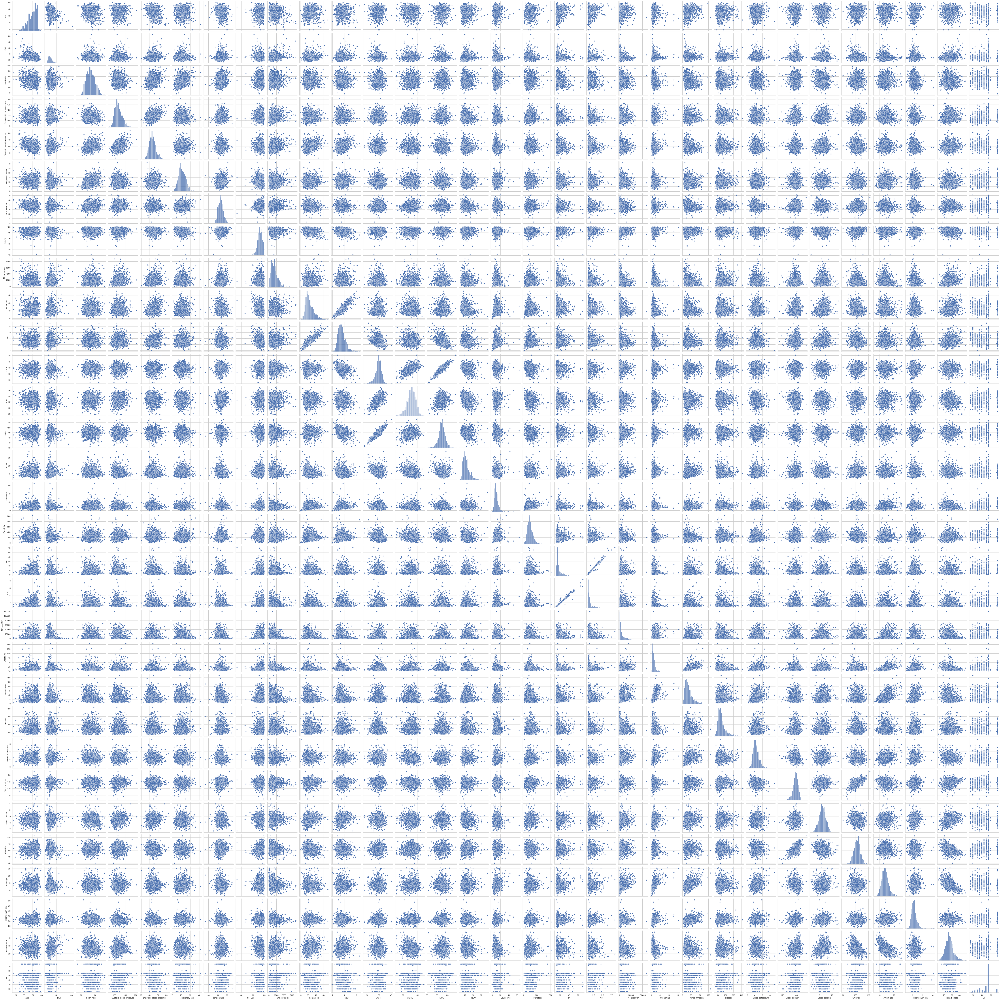

In [12]:
sns.set_theme(style="whitegrid")
sns.pairplot(df2)

hematocrit, MCH, MCHC, MCV, PT should not be selected due to high colinearity with other features (I did not drop RBC or INIR because they are colinear with hematocrit and PT respectively, so since those features are getting dropped then it would not make sense to get rid of them both). 

# Transformations

Made some histograms to see which plots needed to be transformed. If they were heavily skewed I tried to transform them, the list of skewed columns are listed a few cells down

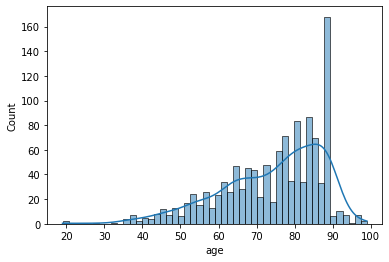

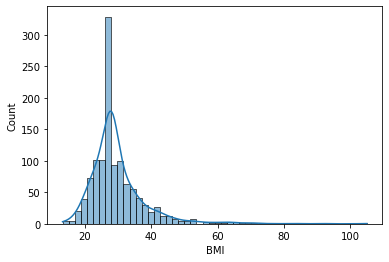

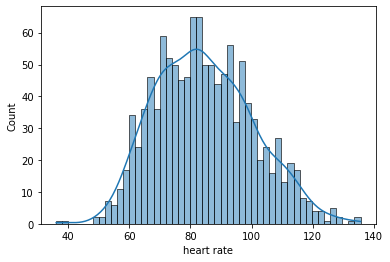

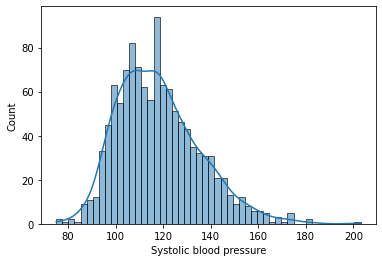

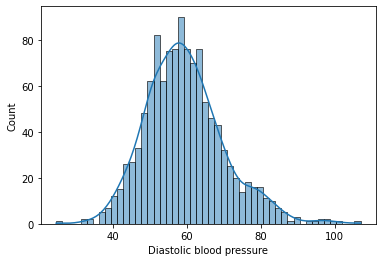

...

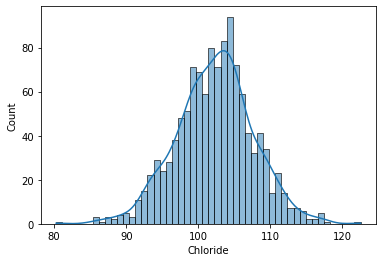

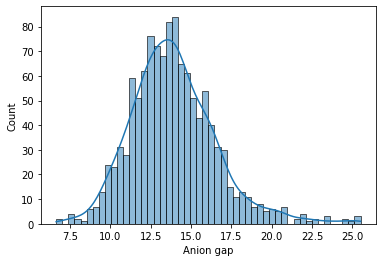

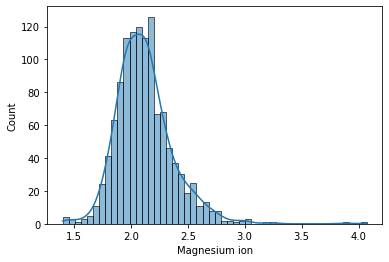

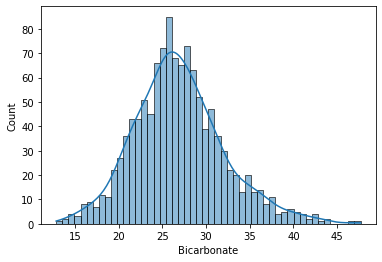

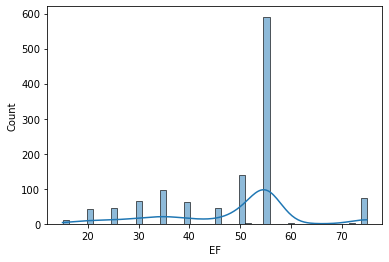

In [12]:
def plot_hist(col): 
    sns.histplot(df[col], kde=True, bins=50)
    plt.show()
for col in numerical_cols:
    plot_hist(col)

These columns are heavily skewed and should be transformed: age, BMI, SP O2, Urine output, RDW, Leuocyte, Platelets, PT, INR, NT-proBNP, Creatinine, Urea nitrogen, glucose, Magnesium ion   

The rest of the numerical_cols are (relatively) normally distributed and do not need to be transformed.

Here I made a list of the columns that needed to be transformed then tested them all with a square root transformation and a log transformation and plotted all of the histograms (original, sqrt transformation, log transformation) and picked whichever one was the most normally distributed.

age
Original


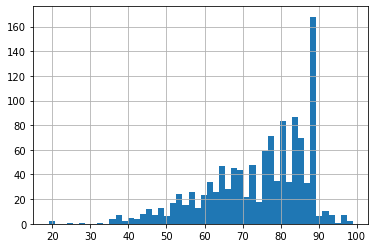

sqrt transformation


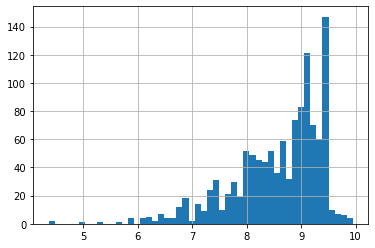

log transformation


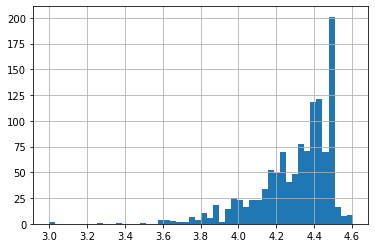

BMI
Original


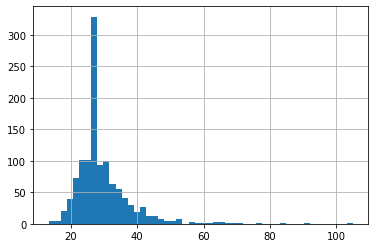

sqrt transformation


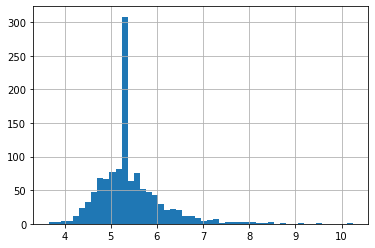

log transformation


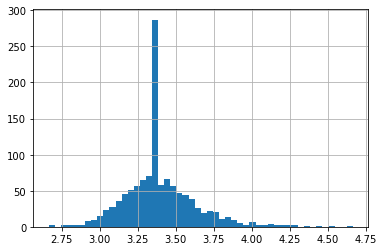

SP O2
Original


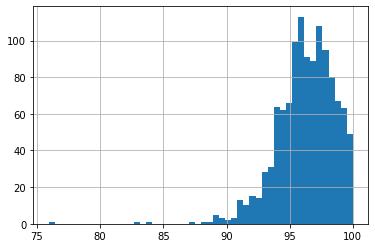

sqrt transformation


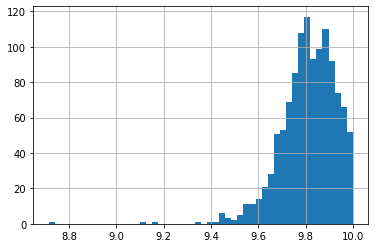

log transformation


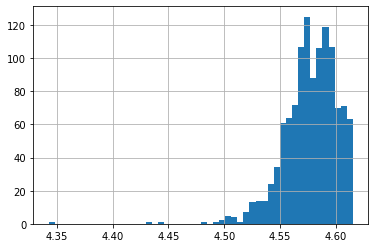

Urine output
Original


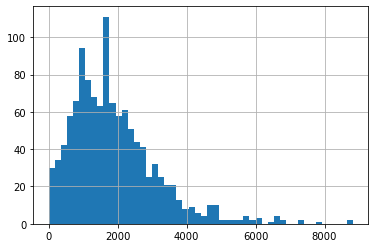

sqrt transformation


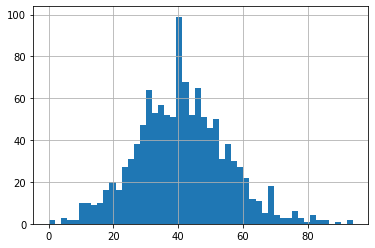

log transformation


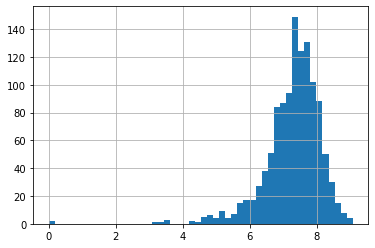

RDW
Original


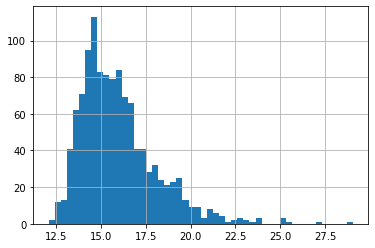

sqrt transformation


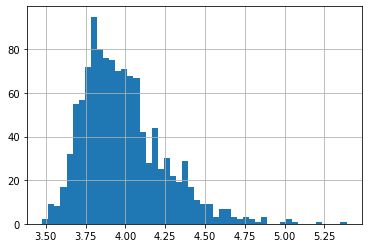

log transformation


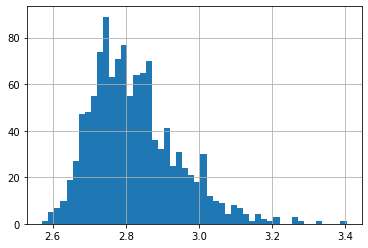

Leucocyte
Original


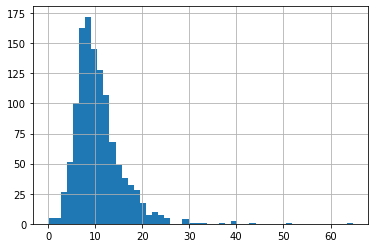

sqrt transformation


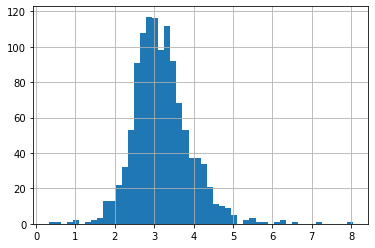

log transformation


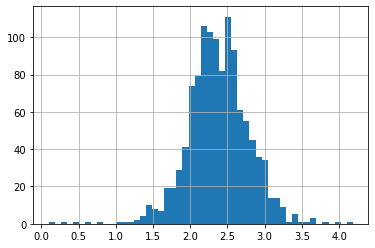

Platelets
Original


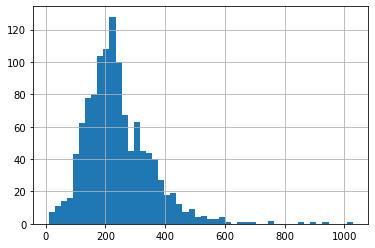

sqrt transformation


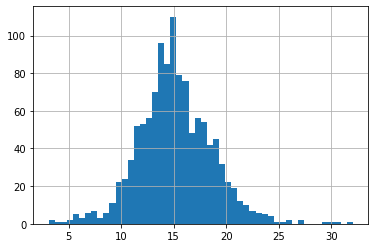

log transformation


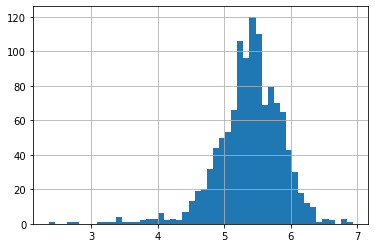

PT
Original


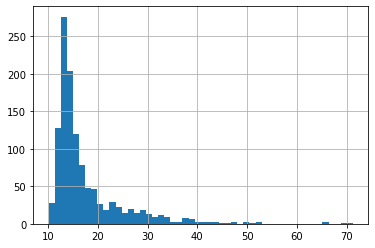

sqrt transformation


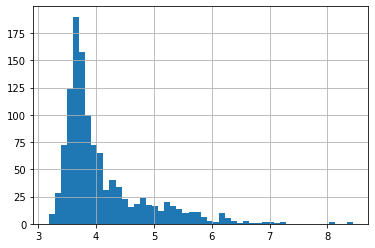

log transformation


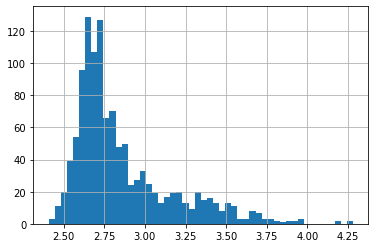

INR
Original


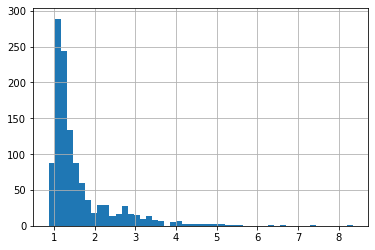

sqrt transformation


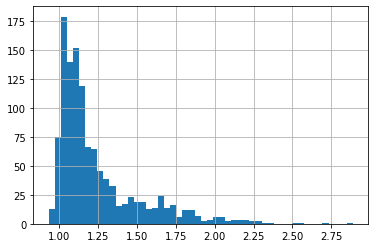

log transformation


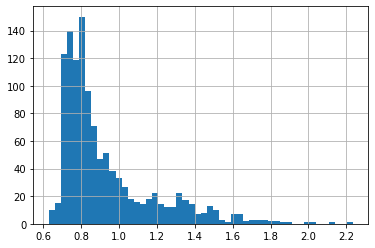

NT-proBNP
Original


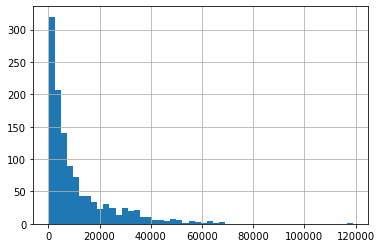

sqrt transformation


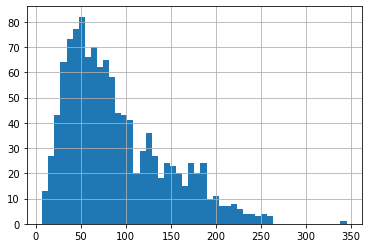

log transformation


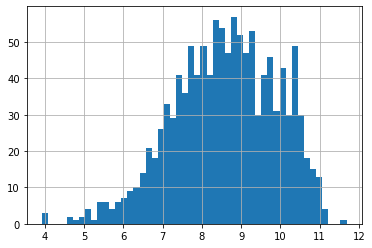

Creatinine
Original


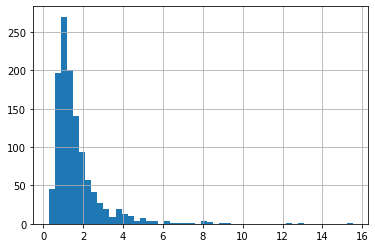

sqrt transformation


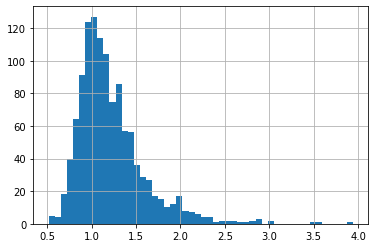

log transformation


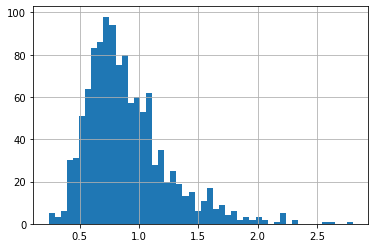

Urea nitrogen
Original


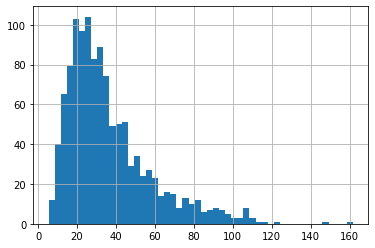

sqrt transformation


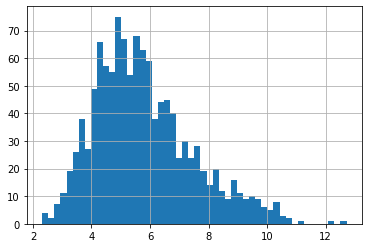

log transformation


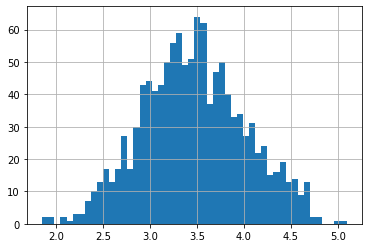

glucose
Original


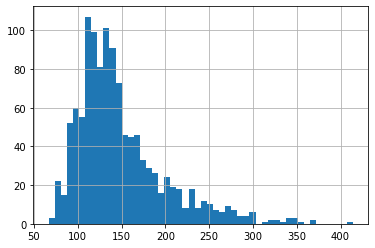

sqrt transformation


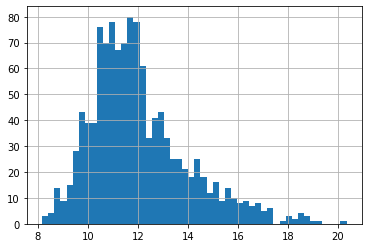

log transformation


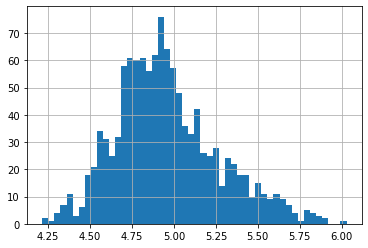

Magnesium ion
Original


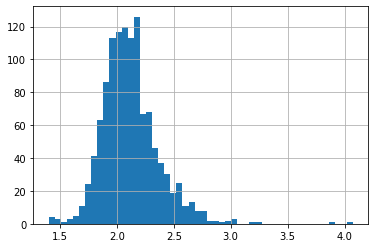

sqrt transformation


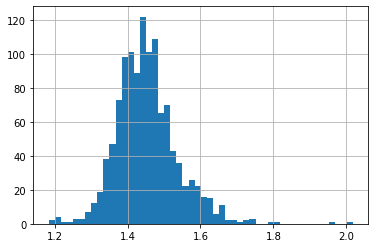

log transformation


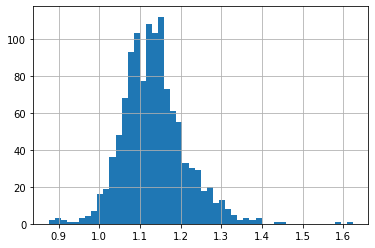

In [13]:
transform_cols = ['age', 'BMI', 'SP O2', 'Urine output', 'RDW', 'Leucocyte', 'Platelets', 'PT', 
                  'INR', 'NT-proBNP', 'Creatinine', 'Urea nitrogen', 'glucose', 'Magnesium ion']

def show_transformations(col):
    print(col)
    print("Original")
    df[col].hist(bins=50) # Plot histogram
    plt.show()
    
    print("sqrt transformation")
    sqrt_transformed_col = df[col].apply(np.sqrt) # Get the square root of data points*
    sqrt_transformed_col.hist(bins=50) # Plot histogram
    plt.show()
    
    print("log transformation")
    log_transformed_col = (df[col] + 1).apply(np.log) # Get the log of the data
    log_transformed_col.hist(bins=50) # Plot histogram
    plt.show()
    
for col in transform_cols:
    show_transformations(col)


Transformation Choices   
age - none   
BMI - log   
SP O2 - none   
Urine output - sqrt   
RDW - log   
Leucocyte - sqrt   
Platelets - sqrt   
PT - none   
INR - none
NT-proBNP - log
Creatinine - log   
Urea nitrogen - log   
glucose - log   
Magnesium ion - none   

Here I made a list for which columns should get which transformations and plugged them all into a their respective function.

In [14]:
sqrt_transforms = ['Urine output', 'Leucocyte', 'Platelets']
log_transforms = ['BMI', 'RDW', 'NT-proBNP', 'Creatinine', 'Urea nitrogen', 'glucose']

def sqrt_transform(col):
    sqrt_transformed_col = df[col].apply(np.sqrt) # Get the square root of data points*
    df[col] = sqrt_transformed_col

def log_transform(col):
    log_transformed_col = (df[col] + 1).apply(np.log) # Get the log of the data
    df[col] = log_transformed_col

for col in sqrt_transforms:
    sqrt_transform(col)

for col in log_transforms:
    log_transform(col)

# Centering and Scaling

These are some functions that center and scale dataframes based on the slides + class. Centering is done by subtracting the mean of the column from all values in the column and then scaling is done by calculating and dividing by the standard deviation

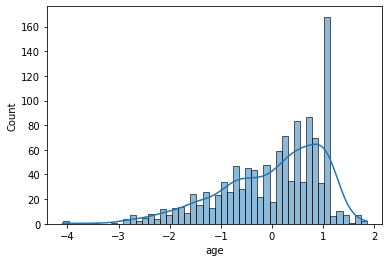

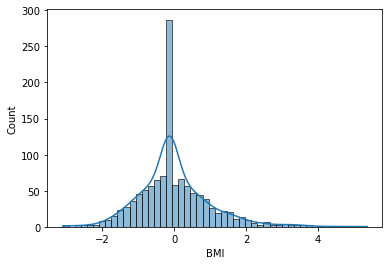

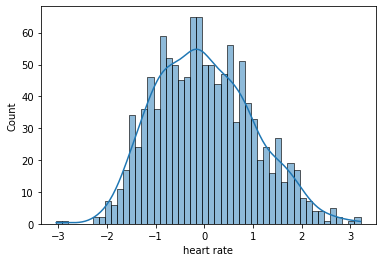

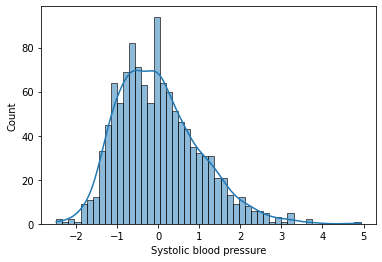

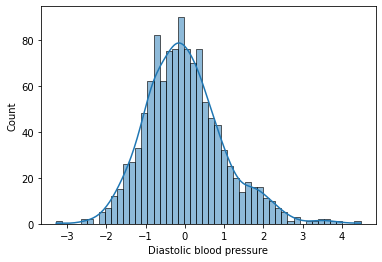

...

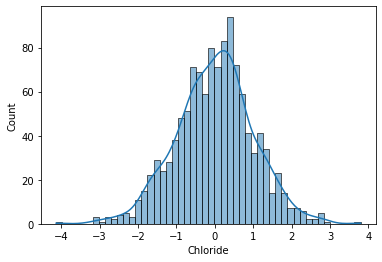

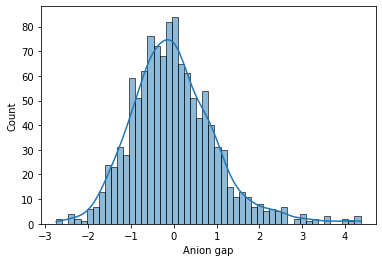

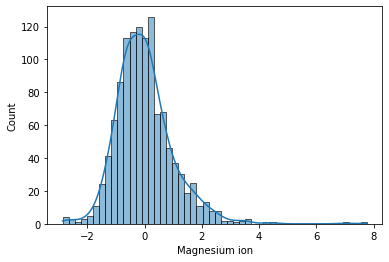

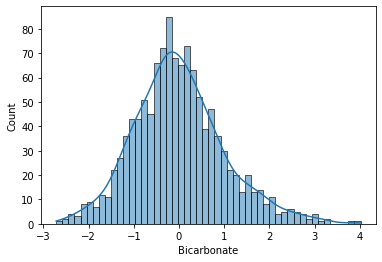

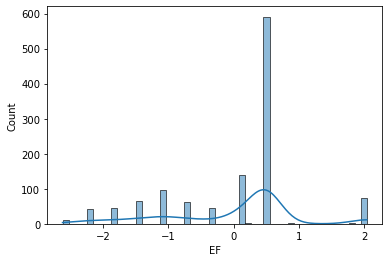

In [15]:
def center_my_dataframe(col):
    mean = df[col].mean() 
    df[col] = df[col].apply(lambda x: x - mean)
    
def scale_my_dataframe(col):
    stdev = df[col].std()
    df[col] = df[col].apply(lambda x: x / stdev)
    
for col in numerical_cols:
    center_my_dataframe(col)
    scale_my_dataframe(col)

for col in numerical_cols:
    plot_hist(col)

# Modelling and Accuracy

Made to dataframes, one with all of the features that would not create noise which would predict the second dataframe values (outcome)

In [16]:
X = df[['group', 'age', 'gendera', 'BMI', 'hypertensive',
       'atrialfibrillation', 'CHD with no MI', 'diabetes', 'deficiencyanemias',
       'depression', 'Hyperlipemia', 'Renal failure', 'COPD', 'heart rate',
       'Systolic blood pressure', 'Diastolic blood pressure',
       'Respiratory rate', 'temperature', 'SP O2', 'Urine output',
       'RBC', 'RDW', 'Leucocyte',
       'Platelets', 'INR', 'NT-proBNP', 'Creatinine', 'Urea nitrogen',
       'glucose', 'Blood potassium', 'Blood sodium', 'Blood calcium',
       'Chloride', 'Anion gap', 'Magnesium ion', 'Bicarbonate', 'EF']]
Y = df['outcome']

Did a test train split that was shown in all the class examples. Also made a function that would print out the accuracy and AUC scores for each ML algorithm selected

In [17]:
# Training set and testing set
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.20, random_state=1)

# Accuracy Function
def model_acc(Y_test, Y_pred):
    print("Accuracy score: ",metrics.accuracy_score(Y_test, Y_pred))
    print("AUC: ",metrics.roc_auc_score(Y_test, Y_pred))

Chose to use a decision tree first because it deals well with noisy data and well with outliers. Since I did not deal with outliers this seemed like a good choice. It also works for classification problems which is what we are dealing with here

In [30]:
# Decision Tree
model = DecisionTreeClassifier(max_leaf_nodes=8, random_state=0)
model.fit(X_train, Y_train)

Y_pred = model.predict(X_test)
decision_tree_result = list(Y_pred)

# Accuracy
model_acc(Y_test, Y_pred)

Accuracy score:  0.902542372881356
AUC:  0.590200248094985


In [31]:
importances = model.feature_importances_
decision_importance = {}
#print(importances)
cols = ['group', 'age', 'gendera', 'BMI', 'hypertensive',
       'atrialfibrillation', 'CHD with no MI', 'diabetes', 'deficiencyanemias',
       'depression', 'Hyperlipemia', 'Renal failure', 'COPD', 'heart rate',
       'Systolic blood pressure', 'Diastolic blood pressure',
       'Respiratory rate', 'temperature', 'SP O2', 'Urine output',
       'RBC', 'RDW', 'Leucocyte',
       'Platelets', 'INR', 'NT-proBNP', 'Creatinine', 'Urea nitrogen',
       'glucose', 'Blood potassium', 'Blood sodium', 'Blood calcium',
       'Chloride', 'Anion gap', 'Magnesium ion', 'Bicarbonate', 'EF']

decision_res = {cols[i]: importances[i] for i in range(len(cols))}
dict(sorted(decision_res.items(), key=lambda item: item[1]))

{'group': 0.0,
 'age': 0.0,
 'gendera': 0.0,
 'BMI': 0.0,
 'hypertensive': 0.0,
 'atrialfibrillation': 0.0,
 'CHD with no MI': 0.0,
 'diabetes': 0.0,
 'deficiencyanemias': 0.0,
 'depression': 0.0,
 'Hyperlipemia': 0.0,
 'COPD': 0.0,
 'heart rate': 0.0,
 'Systolic blood pressure': 0.0,
 'Diastolic blood pressure': 0.0,
 'Respiratory rate': 0.0,
 'RBC': 0.0,
 'RDW': 0.0,
 'Platelets': 0.0,
 'INR': 0.0,
 'NT-proBNP': 0.0,
 'Creatinine': 0.0,
 'Urea nitrogen': 0.0,
 'glucose': 0.0,
 'Blood potassium': 0.0,
 'Blood sodium': 0.0,
 'Blood calcium': 0.0,
 'Chloride': 0.0,
 'Magnesium ion': 0.0,
 'EF': 0.0,
 'Bicarbonate': 0.08736696936079848,
 'temperature': 0.09017798491699838,
 'SP O2': 0.09859519462541341,
 'Urine output': 0.12073719294434397,
 'Leucocyte': 0.12474119583926692,
 'Renal failure': 0.1876642916570176,
 'Anion gap': 0.2907171706561612}

Calculated importance of features in Decision Tree model. Bottom values are most important (importance indicated by number on the right, the higher the number the more important the feature).

Chose random forest model second because it has high accuracy and provides reliable feature importance estimate. Also, one of the drawbacks of this model is that it takes a while to make predictions, however since we are dealing with static data the length of time that it takes to make predictions does not matter much. 

In [32]:
model = RandomForestClassifier(random_state=1, max_depth=10)
model.fit(X_train, Y_train)

Y_pred = model.predict(X_test)
random_forest_result = list(Y_pred)

# Accuracy
model_acc(Y_test, Y_pred)

Accuracy score:  0.902542372881356
AUC:  0.5740740740740741


In [33]:
importances = model.feature_importances_
forest_importance = {}
#print(importances)
cols = ['group', 'age', 'gendera', 'BMI', 'hypertensive',
       'atrialfibrillation', 'CHD with no MI', 'diabetes', 'deficiencyanemias',
       'depression', 'Hyperlipemia', 'Renal failure', 'COPD', 'heart rate',
       'Systolic blood pressure', 'Diastolic blood pressure',
       'Respiratory rate', 'temperature', 'SP O2', 'Urine output',
       'RBC', 'RDW', 'Leucocyte',
       'Platelets', 'INR', 'NT-proBNP', 'Creatinine', 'Urea nitrogen',
       'glucose', 'Blood potassium', 'Blood sodium', 'Blood calcium',
       'Chloride', 'Anion gap', 'Magnesium ion', 'Bicarbonate', 'EF']

forest_res = {cols[i]: importances[i] for i in range(len(cols))}
dict(sorted(forest_res.items(), key=lambda item: item[1]))

{'COPD': 0.00038270612256856025,
 'depression': 0.0013884008145632017,
 'group': 0.002226034653546162,
 'CHD with no MI': 0.002459846588234132,
 'Hyperlipemia': 0.0026045869144025067,
 'diabetes': 0.0030689882017760676,
 'gendera': 0.0039214290897466916,
 'atrialfibrillation': 0.004454789578358334,
 'hypertensive': 0.005277076774130816,
 'deficiencyanemias': 0.005449774893470327,
 'Renal failure': 0.01128987536741601,
 'EF': 0.013121645028706481,
 'age': 0.01796193878745305,
 'BMI': 0.02466799166527402,
 'Diastolic blood pressure': 0.025783532604571342,
 'Blood sodium': 0.02827739985933971,
 'Magnesium ion': 0.02867445149845739,
 'heart rate': 0.03019178426933116,
 'RBC': 0.0303658660738926,
 'NT-proBNP': 0.030898875509335504,
 'RDW': 0.031439998948088375,
 'Creatinine': 0.03356760456436431,
 'Chloride': 0.03370719123421584,
 'Respiratory rate': 0.03536029794095329,
 'Systolic blood pressure': 0.03543953442716403,
 'SP O2': 0.03568266731867431,
 'glucose': 0.037370329423455015,
 'Blood

Calculated importance of features in Random Forest model. Bottom values are most important (importance indicated by number on the right, the higher the number the more important the feature).